# Importing Necessary Libraries

In [72]:
#Importing necessary libraries
# !pip install pygwalker
# !pip install textblob
# !pip install wordcloud
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pygwalker as pyg
import nltk
import re
import itertools
import networkx as nx
import warnings
warnings.filterwarnings('ignore')
from textblob import TextBlob
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk import bigrams
from collections import Counter
from nltk import trigrams
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import MDS
from sklearn.feature_selection import chi2
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans



# Import Dataset 

In [73]:
#Import wine csv
wine = pd.read_csv('wine_data.csv')

#Display the first 5 rows of the dataframe
print(wine.head())


    country                                        description  \
0  Portugal  This is ripe and fruity, a wine that is smooth...   
1        US  Tart and snappy, the flavors of lime flesh and...   
2        US  Pineapple rind, lemon pith and orange blossom ...   
3        US  Much like the regular bottling from 2012, this...   
4    France  This has great depth of flavor with its fresh ...   

                          designation  points  price  province  \
0                            Avidagos      87     15     Douro   
1                                 NaN      87     14    Oregon   
2                Reserve Late Harvest      87     13  Michigan   
3  Vintner's Reserve Wild Child Block      87     65    Oregon   
4                         Les Natures      87     27    Alsace   

              region_1           region_2         taster_name  \
0                  NaN                NaN          Roger Voss   
1    Willamette Valley  Willamette Valley        Paul Gregutt   
2  Lake Mic

# Interactive EDA using Tableau Dashboards

In [74]:
#Using pygwalker

walker = pyg.walk(wine)
walker


Box(children=(HTML(value='<div id="ifr-pyg-000610fff2d00f91Xoxrh7Qwf1Kzskjc" style="height: auto">\n    <head>…

In [75]:
# Download the 'punkt' tokenizer and 'stopwords' dataset
nltk.download('punkt')
nltk.download('stopwords')


# Initialize the WordNetLemmatizer
lemmatizer = WordNetLemmatizer()

def process_description(description):
    # Remove non-alphabetic characters and lowercase the text
    description = re.sub('[^a-zA-Z]', ' ', description).lower()
    # Tokenize the description
    description_words = word_tokenize(description)
    # Extend the stopword list with domain-specific words
    extended_stopwords = set(stopwords.words('english')) | {'wine', 'flavour', 'flavors', 'flavor', 'taste','drink','finish'}
    # Remove stopwords and lemmatize the remaining words
    description_words = [lemmatizer.lemmatize(word) for word in description_words if word not in extended_stopwords]
    return ' '.join(description_words)


wine['description'] = wine['description'].apply(process_description)

# Display the first 5 rows of the dataframe
print(wine.head())

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\pc\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\pc\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


    country                                        description  \
0  Portugal  ripe fruity smooth still structured firm tanni...   
1        US  tart snappy lime flesh rind dominate green pin...   
2        US  pineapple rind lemon pith orange blossom start...   
3        US  much like regular bottling come across rather ...   
4    France  great depth fresh apple pear fruit touch spice...   

                          designation  points  price  province  \
0                            Avidagos      87     15     Douro   
1                                 NaN      87     14    Oregon   
2                Reserve Late Harvest      87     13  Michigan   
3  Vintner's Reserve Wild Child Block      87     65    Oregon   
4                         Les Natures      87     27    Alsace   

              region_1           region_2         taster_name  \
0                  NaN                NaN          Roger Voss   
1    Willamette Valley  Willamette Valley        Paul Gregutt   
2  Lake Mic

# Word Frequency Dictionaries

In [76]:
# Concatenate all processed descriptions to calculate word frequency
all_descriptions = ' '.join(wine['description'])

# Tokenize the concatenated descriptions
words = word_tokenize(all_descriptions)

# Calculate word frequency (no need to filter out stopwords again, as it was already done)
word_counts = Counter(words)
most_common_words = word_counts.most_common(10)

# Display the most common words
print(most_common_words)

[('fruit', 44781), ('aroma', 27694), ('palate', 27306), ('cherry', 26451), ('tannin', 24769), ('acidity', 23753), ('black', 22046), ('ripe', 19406), ('note', 17686), ('red', 16312)]


# Word Frequency Plot

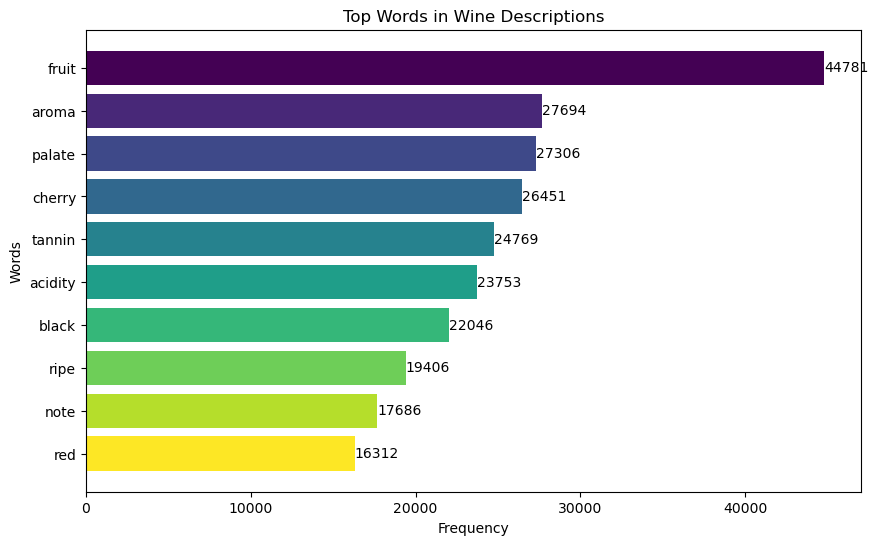

In [77]:
# Separate the words and their frequencies
words, frequencies = zip(*most_common_words)

# Define a list of colors for each bar
colors = plt.cm.viridis(np.linspace(0, 1, len(words)))

# Create the multi-colored bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(words, frequencies, color=colors)  # Apply the color list to the bars

plt.xlabel('Frequency')
plt.ylabel('Words')
plt.title('Top Words in Wine Descriptions')
plt.gca().invert_yaxis()  # Invert y-axis to display the highest frequency at the top

# Add frequency values on top of each bar
for bar, frequency in zip(bars, frequencies):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2,
             f'{frequency}',  # Text to display (frequency value)
             va='center',  # Vertical alignment
             ha='left',  # Horizontal alignment
             color='black')  # Text color

plt.show()

# Word Cloud

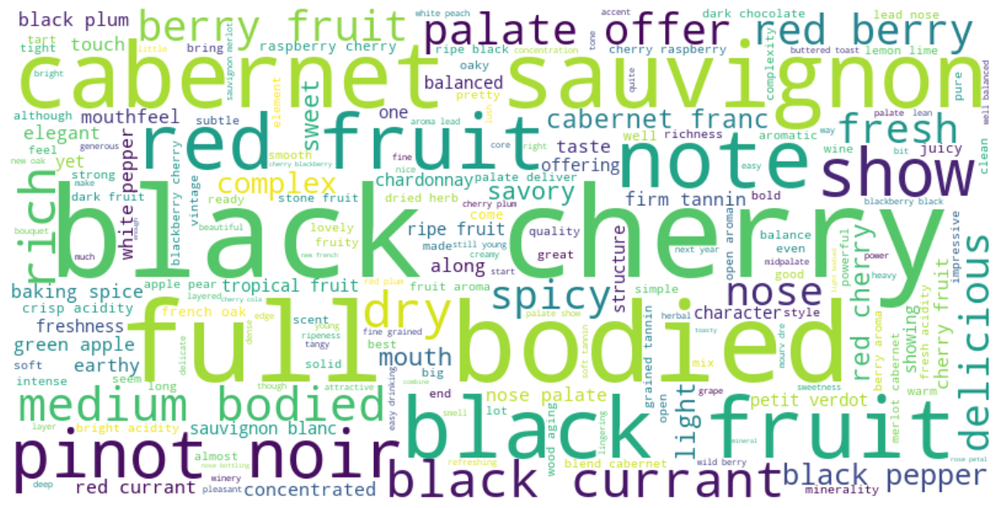

In [78]:
wordcloud = WordCloud(background_color='white', width=800, height=400).generate(all_descriptions)

# Display the word cloud
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide the axes
plt.show()

# Bigrams analysis Heatmap

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\pc\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


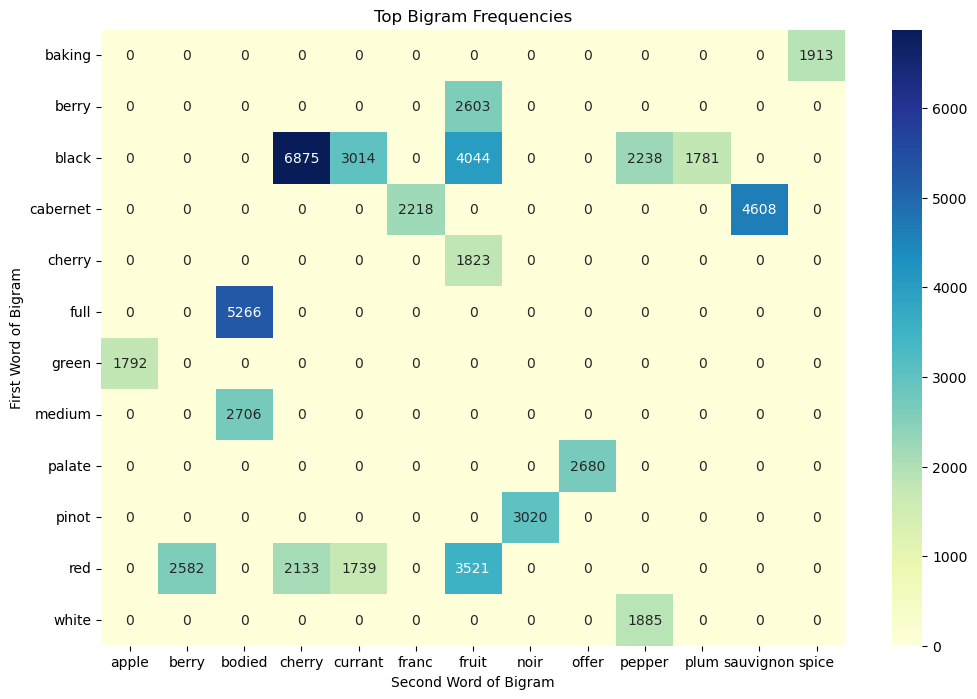

In [79]:
# Ensure we have the necessary NLTK resources
nltk.download('stopwords')

# Define a set of English stopwords
stop_words = set(stopwords.words('english')) | {'wine', 'flavour', 'flavors', 'flavor', 'taste','drink','finish'}

# Function to filter out stopwords and non-alphanumeric words
def filter_stopwords_and_non_alpha(tokens):
    return [token.lower() for token in tokens if token.lower() not in stop_words and token.isalpha()]

# Assuming df['description'] is your DataFrame's text column
# Filter stopwords from the text, then generate and count bigrams
filtered_bigrams = bigrams(itertools.chain(*wine['description'].apply(lambda x: filter_stopwords_and_non_alpha(x.split()))))
bigram_freq = Counter(filtered_bigrams)

# Proceed to visualize the top N bigrams using the method of your choice

N = 20
top_bigrams = bigram_freq.most_common(N)
bigram_df = pd.DataFrame(top_bigrams, columns=['Bigram', 'Frequency'])

# Create a pivot table for the heatmap
pivot_table = bigram_df.pivot_table(index=[bigram_df.Bigram.apply(lambda x: x[0])], 
                                    columns=[bigram_df.Bigram.apply(lambda x: x[1])], 
                                    values='Frequency')

# Fill missing values with 0 (for bigrams that did not appear)
pivot_table = pivot_table.fillna(0)

# Create the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, cmap="YlGnBu", fmt="g")
plt.title("Top Bigram Frequencies")
plt.ylabel("First Word of Bigram")
plt.xlabel("Second Word of Bigram")
plt.show()

# Trigrams Analysis Network

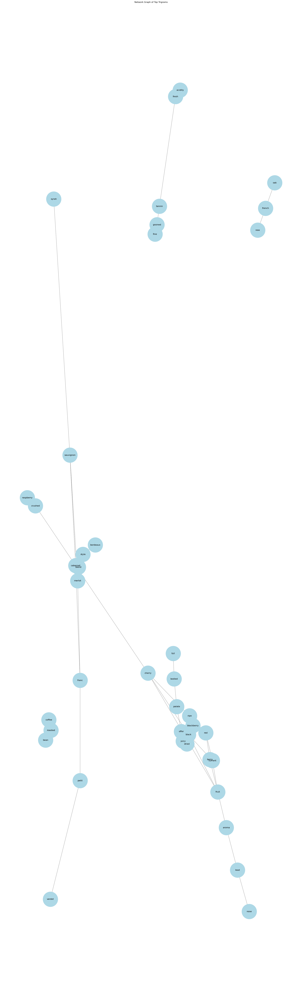

In [80]:
# Define a set of English stopwords
set(stopwords.words('english')) | {'wine', 'flavour', 'flavors', 'flavor', 'taste','drink','finish'}

# Function to filter out stopwords and non-alphanumeric words
def filter_stopwords_and_non_alpha(tokens):
    return [token.lower() for token in tokens if token.lower() not in stop_words and token.isalpha()]

# Generate and count trigrams, excluding stopwords
filtered_trigrams = trigrams(itertools.chain(*wine['description'].apply(lambda x: filter_stopwords_and_non_alpha(x.split()))))
trigram_freq = Counter(filtered_trigrams)

# Select top N trigrams for visualization
N = 30
top_trigrams = trigram_freq.most_common(N)

# Create a directed graph from top trigrams
G = nx.DiGraph()

# Add edges for top trigrams
for trigram, weight in top_trigrams:
    G.add_edge(trigram[0], trigram[1], weight=weight)
    G.add_edge(trigram[1], trigram[2], weight=weight)

# Draw the graph
plt.figure(figsize=(30, 100))
pos = nx.spring_layout(G, k=0.5)  # Positions for all nodes

# Nodes
nx.draw_networkx_nodes(G, pos, node_size=7000, node_color="lightblue")

# Edges
edges = G.edges(data=True)
nx.draw_networkx_edges(G, pos, arrowstyle="->", arrowsize=20, edge_color="gray")

# Labels
nx.draw_networkx_labels(G, pos, font_size=12)

plt.title("Network Graph of Top Trigrams")
plt.axis("off")
plt.show()


# Sentiment Analysis Polarity

In [81]:
# Calculate sentiment polarity for each description
wine['sentiment_polarity'] = wine['description'].apply(lambda x: TextBlob(x).sentiment.polarity)

# Overview of sentiment distribution
print(wine['sentiment_polarity'].head(15))

0     0.220000
1     0.083333
2    -0.166667
3     0.244444
4     0.320833
5     0.358333
6     0.008333
7     0.103333
8     0.233333
9    -0.060000
10    0.111396
11   -0.179167
12    0.333333
13    0.100000
14   -0.040278
Name: sentiment_polarity, dtype: float64


# N-gram Analysis (Sample size = 5000)

In [82]:
wine_sample = wine.sample(n=5000, random_state=1) # This line can be commented out to use the full dataset, but it may take longer to run

# Combine default English stop words with your custom stop words and convert to list
custom_stop_words = list(set(stopwords.words('english')) | {'wine', 'flavour', 'flavors', 'flavor', 'taste', 'drink','finish'})

# Continue with the TF-IDF vectorization
tfidf = TfidfVectorizer(sublinear_tf=True, min_df=5, norm='l2', encoding='latin-1', ngram_range=(1, 3), stop_words=custom_stop_words)
features = tfidf.fit_transform(wine_sample['description']).toarray()
wine_sample['category_id'] = wine_sample['variety'].factorize()[0]
category_id_df = wine_sample[['variety', 'category_id']].drop_duplicates().sort_values('category_id')
category_to_id = dict(category_id_df.values)

N = 3  # Number of top features to display

# Loop through all varieties instead of the first 10
for variety, category_id in category_to_id.items():
    features_chi2 = chi2(features, wine_sample['category_id'] == category_id)
    indices = np.argsort(features_chi2[0])
    feature_names = np.array(tfidf.get_feature_names_out())[indices]
    unigrams = [v for v in feature_names if len(v.split(' ')) == 1][-N:]  # Get last N unigrams
    bigrams = [v for v in feature_names if len(v.split(' ')) == 2][-N:]  # Get last N bigrams
    trigrams = [v for v in feature_names if len(v.split(' ')) == 3][-N:]  # Get last N trigrams
    print(f"\n==> {variety}:")
    print("  * Most Correlated Unigrams are: ", ', '.join(unigrams))
    print("  * Most Correlated Bigrams are: ", ', '.join(bigrams))
    print("  * Most Correlated Trigrams are: ", ', '.join(trigrams))



==> Riesling:
  * Most Correlated Unigrams are:  saffron, peach, riesling
  * Most Correlated Bigrams are:  peach apricot, lime acidity, dry riesling
  * Most Correlated Trigrams are:  ripe stone fruit, yellow peach apricot, lemon lime acidity

==> Chardonnay:
  * Most Correlated Unigrams are:  pineapple, buttered, chardonnay
  * Most Correlated Bigrams are:  yellow fruit, tropical fruit, buttered toast
  * Most Correlated Trigrams are:  pineapple green apple, ripe yellow fruit, buttered toast vanilla

==> Portuguese Red:
  * Most Correlated Unigrams are:  douro, nacional, touriga
  * Most Correlated Bigrams are:  blend touriga, tinta roriz, touriga nacional
  * Most Correlated Trigrams are:  black plum fruit, juicy red fruit, blend touriga nacional

==> Champagne Blend:
  * Most Correlated Unigrams are:  nonvintage, dosage, champagne
  * Most Correlated Bigrams are:  noir chardonnay, blend three, blend pinot
  * Most Correlated Trigrams are:  ripe red berry, pinot noir chardonnay, bl

# MDS plot on Wine variety

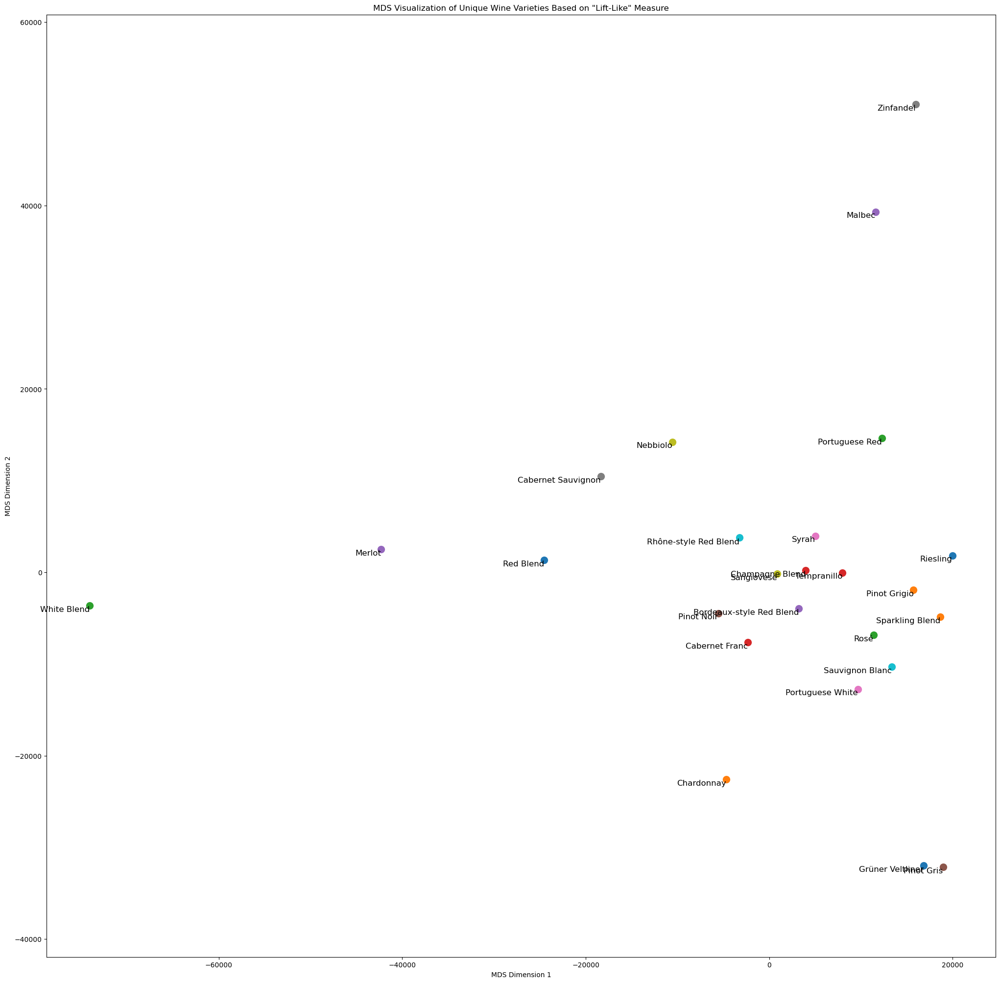

In [83]:
# Ensure all unique varieties are considered for visualization
wine_unique_varieties = wine_sample.drop_duplicates(subset='variety')

# Combine default English stop words with your custom stop words and convert to list
custom_stop_words = list(set(stopwords.words('english')) | {'wine', 'flavour', 'flavors', 'flavor', 'taste', 'drink','finish'})

# Use CountVectorizer for creating a binary term-document matrix
vectorizer = CountVectorizer(stop_words=custom_stop_words, binary=True, ngram_range=(1, 3))
binary_matrix = vectorizer.fit_transform(wine_unique_varieties['description']).toarray()

# Calculate document frequency for terms
doc_freq = np.sum(binary_matrix > 0, axis=0)

# Calculate pairwise "lift-like" scores
n_docs = binary_matrix.shape[0]
lift_scores = np.zeros((n_docs, n_docs))

for i in range(n_docs):
    for j in range(i + 1, n_docs):  # Adjust loop to avoid self-comparison
        shared_terms = np.sum(binary_matrix[i] & binary_matrix[j])
        # Calculate expected co-occurrence if terms were independent
        expected_shared = np.product(doc_freq[[i, j]]) / n_docs**2
        lift = (shared_terms / expected_shared) if expected_shared > 0 else 0
        lift_scores[i, j] = lift
        lift_scores[j, i] = lift  # Ensure symmetry

# Inverse the lift scores to use as dissimilarity
dissimilarity = 1 / (lift_scores + 1e-5)

# Apply MDS
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
X_mds = mds.fit_transform(dissimilarity)

# Visualization with adjusted label positioning
plt.figure(figsize=(25, 25))
varieties = wine_unique_varieties['variety'].tolist()
for i, (x, y) in enumerate(X_mds):
    plt.scatter(x, y, s=100)  # Increase point size for better visibility
    # Adjust label positioning: slightly lower the label below the point
    plt.text(x, y - 0.01, varieties[i], fontsize=12, ha='right', va='top')

plt.title('MDS Visualization of Unique Wine Varieties Based on "Lift-Like" Measure')
plt.xlabel('MDS Dimension 1')
plt.ylabel('MDS Dimension 2')
plt.axis('equal')  # Optional: Makes sure the scaling on both axes is equal
plt.show()

# Determining optimal number of clusters  for k-means clustering (sample of 5000)

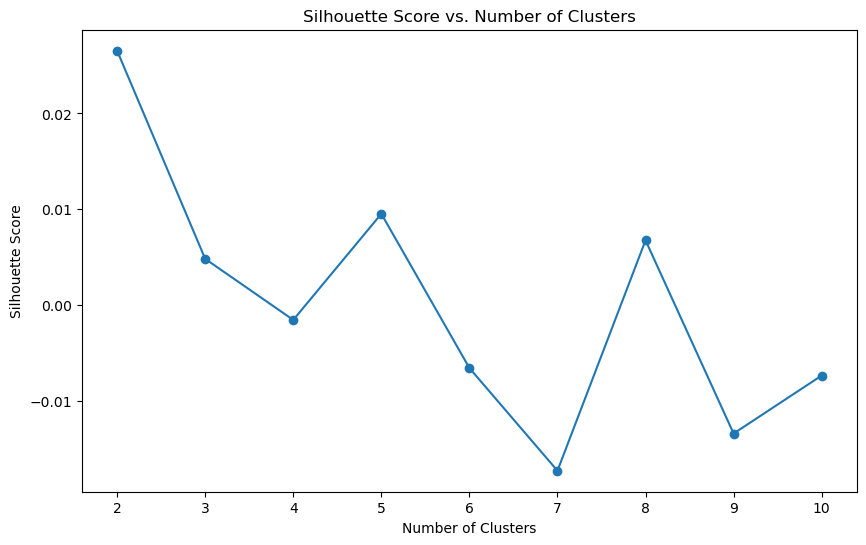

In [84]:
# Combine default English stop words with your custom stop words and convert to list
custom_stop_words = list(set(stopwords.words('english')) | {'wine', 'flavour', 'flavors', 'flavor', 'taste', 'drink','finish'})

# Use CountVectorizer for creating a binary term-document matrix
vectorizer = CountVectorizer(stop_words=custom_stop_words, binary=True, ngram_range=(1, 3))
X = vectorizer.fit_transform(wine_sample['description'])

# Range of clusters to try
range_n_clusters = list(range(2, 11))  # For example, trying from 2 to 10 clusters

silhouette_scores = []

for n_clusters in range_n_clusters:
    # Step 2: Apply KMeans and calculate silhouette scores
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Step 3: Plot silhouette scores vs number of clusters
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()


Using 3 as optimal, because of memory constraint i.e. sample size of 5000 only enables maximum of 4 clusters

# Cluster Centroids 

In [86]:
# Step 1: Preprocess the descriptions
custom_stop_words = list(set(stopwords.words('english')) | {'wine', 'flavour', 'flavors', 'flavor', 'taste', 'drink','finish'})
tfidf_vectorizer = TfidfVectorizer(stop_words=custom_stop_words, ngram_range=(1, 3))
X_tfidf = tfidf_vectorizer.fit_transform(wine_sample['description'])

# Step 2: Cluster the processed descriptions
num_clusters = 3  # This is an arbitrary choice; adjust as needed
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(X_tfidf)

# Assign cluster labels to the DataFrame
wine_sample['Cluster'] = clusters

# Step 3: Determine the most representative cluster for each variety
# Group by variety, then count occurrences in each cluster
variety_cluster_distribution = wine_sample.groupby(['variety', 'Cluster']).size().reset_index(name='count')

# Identify the cluster where each variety most frequently occurs
variety_preferred_cluster = variety_cluster_distribution.loc[variety_cluster_distribution.groupby('variety')['count'].idxmax()]

# Step 4: For each cluster, list unique varieties assigned to it based on the most representative cluster
unique_varieties_by_cluster = {}
for cluster in range(num_clusters):
    varieties_in_cluster = variety_preferred_cluster[variety_preferred_cluster['Cluster'] == cluster]['variety'].unique()
    unique_varieties_by_cluster[cluster] = varieties_in_cluster

# Display the results
print("Varieties assigned to each cluster:")
for cluster, varieties in unique_varieties_by_cluster.items():
    print(f"Cluster {cluster}: {list(varieties)}")

Varieties assigned to each cluster:
Cluster 0: ['Nebbiolo', 'Sangiovese']
Cluster 1: ['Bordeaux-style Red Blend', 'Cabernet Franc', 'Cabernet Sauvignon', 'Malbec', 'Merlot', 'Portuguese Red', 'Red Blend', 'Rhône-style Red Blend', 'Syrah', 'Zinfandel']
Cluster 2: ['Champagne Blend', 'Chardonnay', 'Grüner Veltliner', 'Pinot Grigio', 'Pinot Gris', 'Pinot Noir', 'Portuguese White', 'Riesling', 'Rosé', 'Sauvignon Blanc', 'Sparkling Blend', 'Tempranillo', 'White Blend']


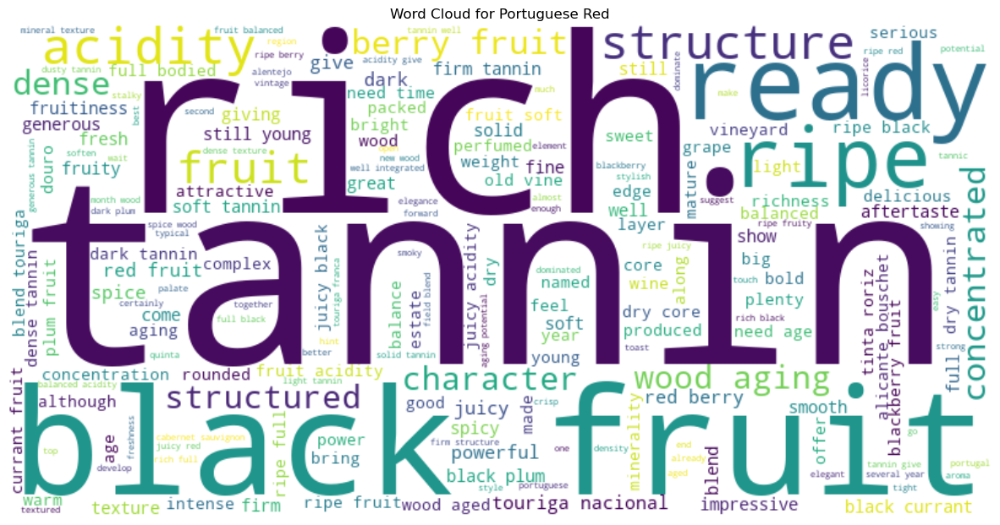

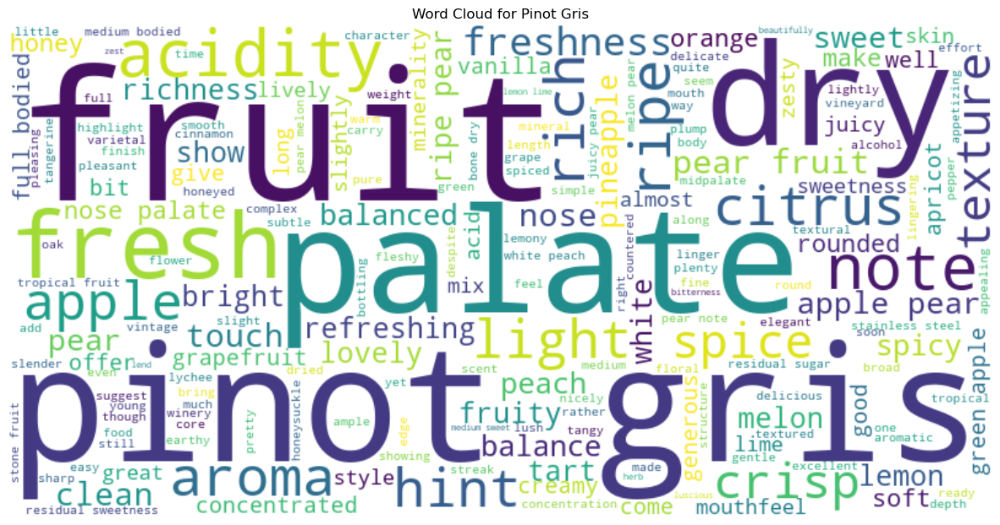

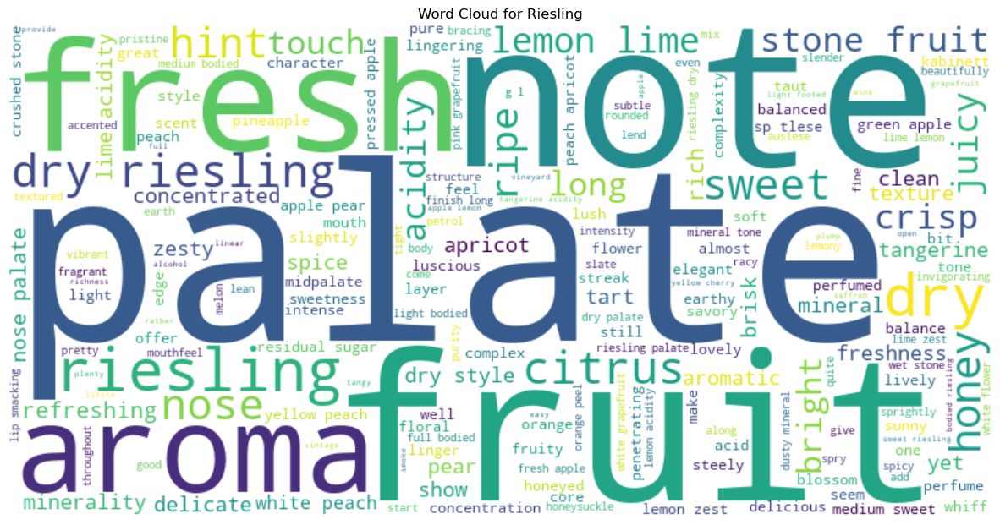

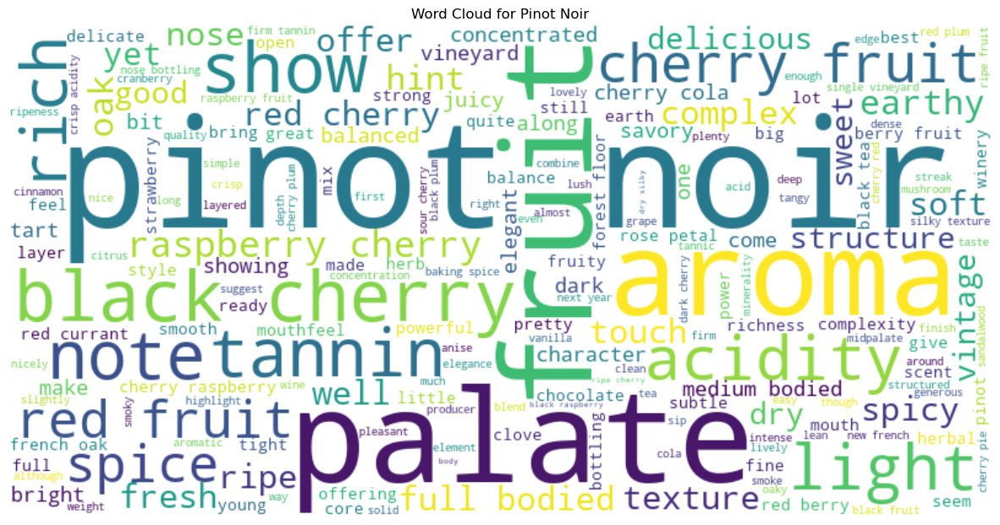

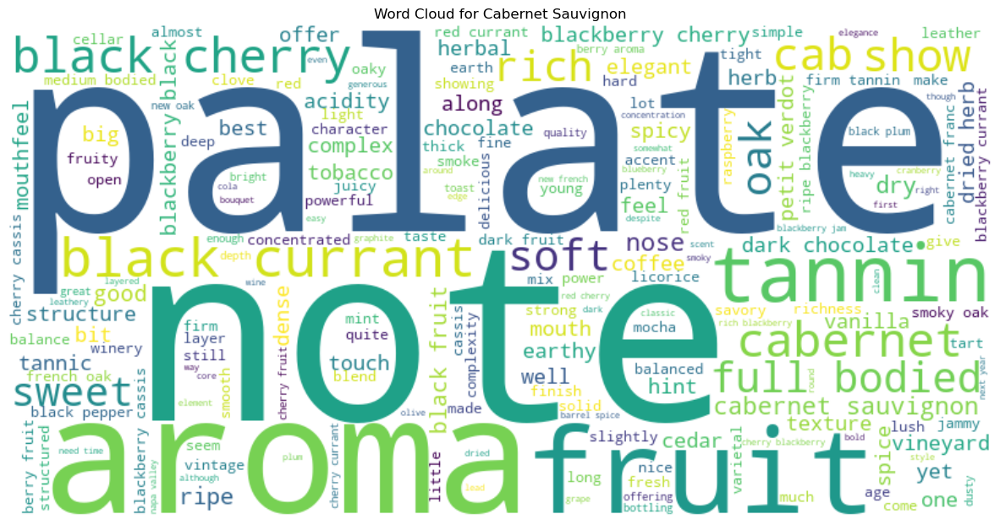

...

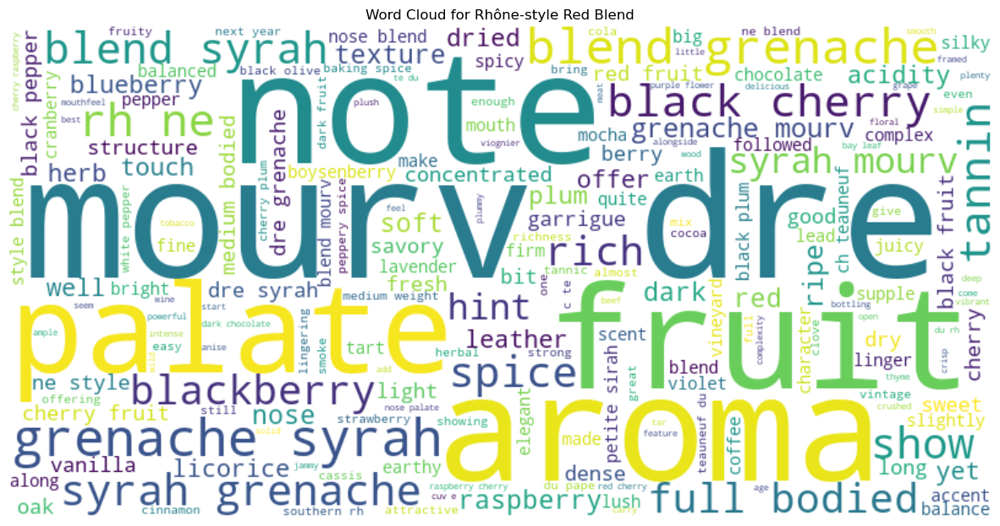

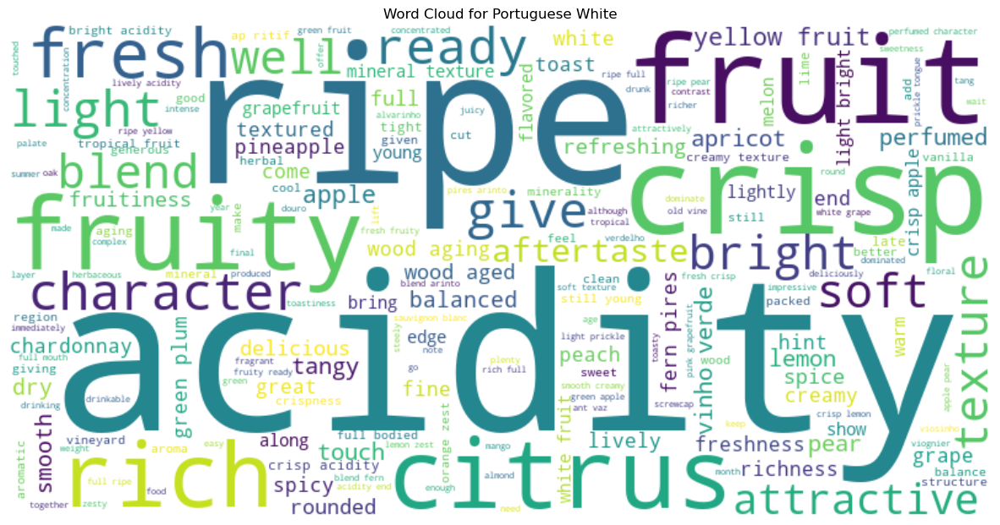

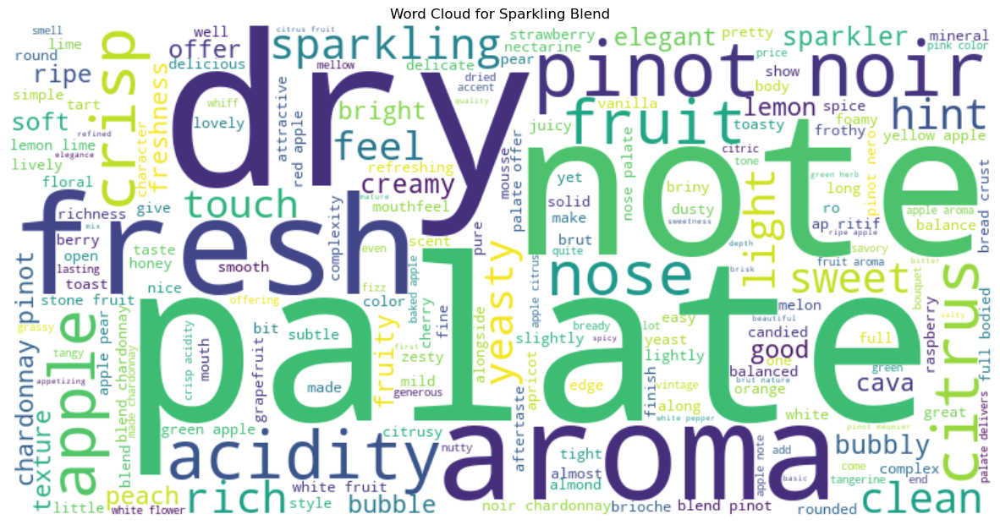

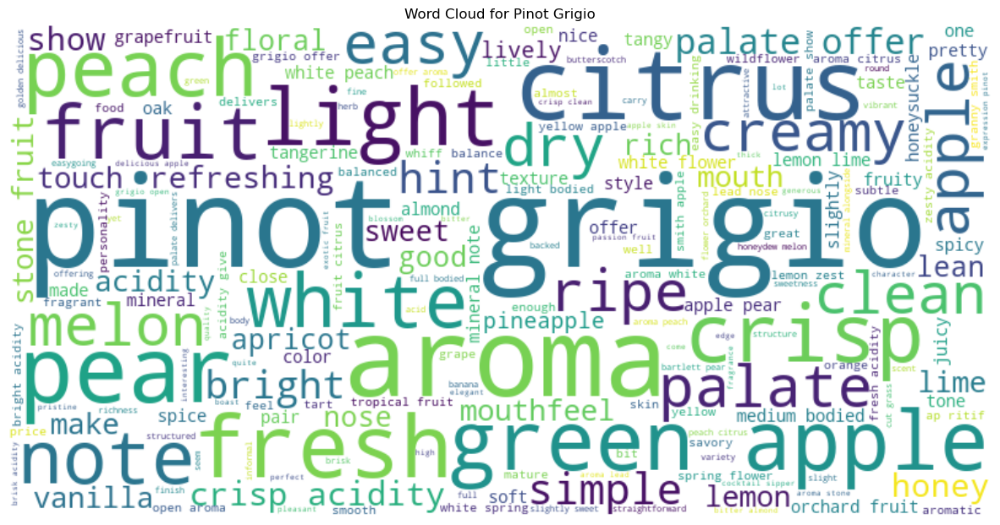

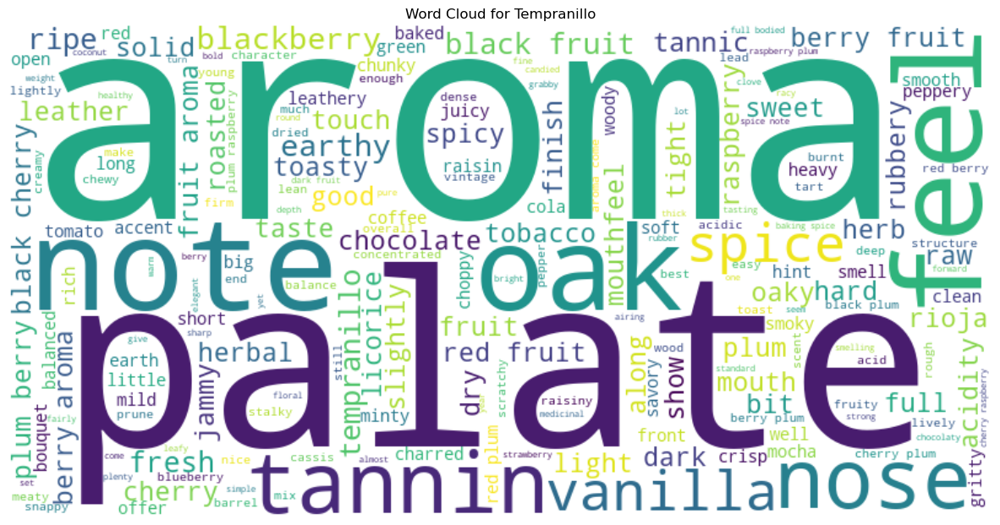

In [67]:
#Create a wordcloud for each variety using all_description column
# Create a word cloud for each variety
for variety in wine['variety'].unique():
    # Filter the DataFrame to only include the current variety
    variety_df = wine[wine['variety'] == variety]
    # Concatenate all descriptions for the current variety
    all_descriptions = ' '.join(variety_df['description'])
    # Create the word cloud
    wordcloud = WordCloud(background_color='white', width=800, height=400).generate(all_descriptions)
    # Display the word cloud
    plt.figure(figsize=(15, 10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {variety}')
    plt.axis('off')  # Hide the axes
    plt.show()